**Continue with the previous exercise. Start by importing the necessary libraries and loading the Adult dataset.**
## Data visualization

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_bokeh
pandas_bokeh.output_notebook()

df = pd.read_csv('./data/adult/adult.csv')
df.head(10)

Loading BokehJS ...

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K
5,34,Private,198693,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K
6,29,?,227026,HS-grad,9,Never-married,?,Unmarried,Black,Male,0,0,40,United-States,<=50K
7,63,Self-emp-not-inc,104626,Prof-school,15,Married-civ-spouse,Prof-specialty,Husband,White,Male,3103,0,32,United-States,>50K
8,24,Private,369667,Some-college,10,Never-married,Other-service,Unmarried,White,Female,0,0,40,United-States,<=50K
9,55,Private,104996,7th-8th,4,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,10,United-States,<=50K


In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   age              48842 non-null  int64 
 1   workclass        48842 non-null  object
 2   fnlwgt           48842 non-null  int64 
 3   education        48842 non-null  object
 4   educational-num  48842 non-null  int64 
 5   marital-status   48842 non-null  object
 6   occupation       48842 non-null  object
 7   relationship     48842 non-null  object
 8   race             48842 non-null  object
 9   gender           48842 non-null  object
 10  capital-gain     48842 non-null  int64 
 11  capital-loss     48842 non-null  int64 
 12  hours-per-week   48842 non-null  int64 
 13  native-country   48842 non-null  object
 14  income           48842 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB


### Plot the distribution of the age of the population using a histogram with 20 bins.

<Axes: ylabel='Frequency'>

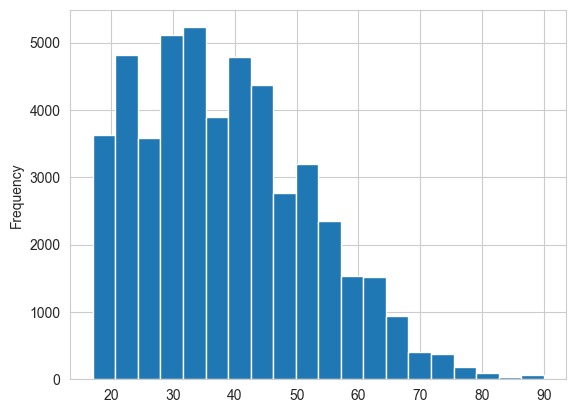

In [3]:
df['age'].plot(kind='hist', bins=20)

### Plot the distribution of the age of the population using a boxplot.

<Axes: >

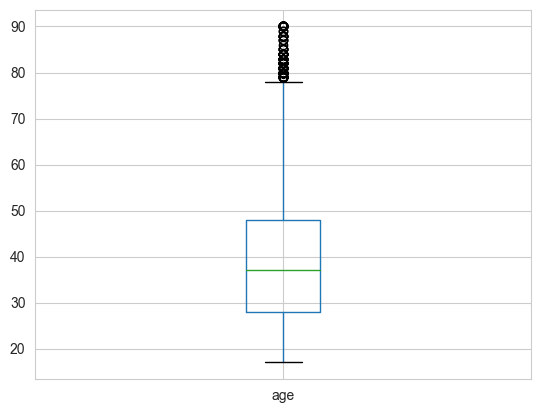

In [4]:
df[['age']].boxplot()

### Plot the distribution of the age of the population using a violinplot.

<Axes: xlabel='age'>

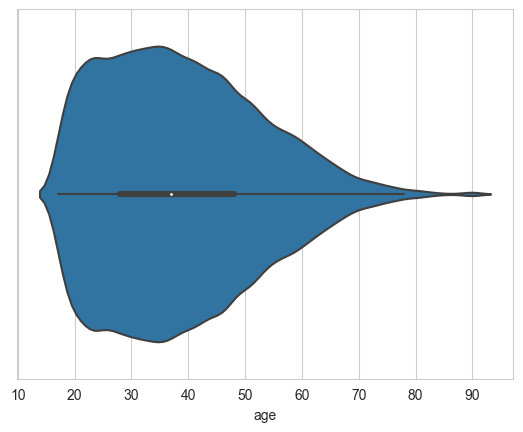

In [5]:
sns.violinplot(data=df, x='age')

### Plot the distribution of the age of the population using a boxplot and a violinplot in the same figure. (hint: use subplots)

<Axes: xlabel='age'>

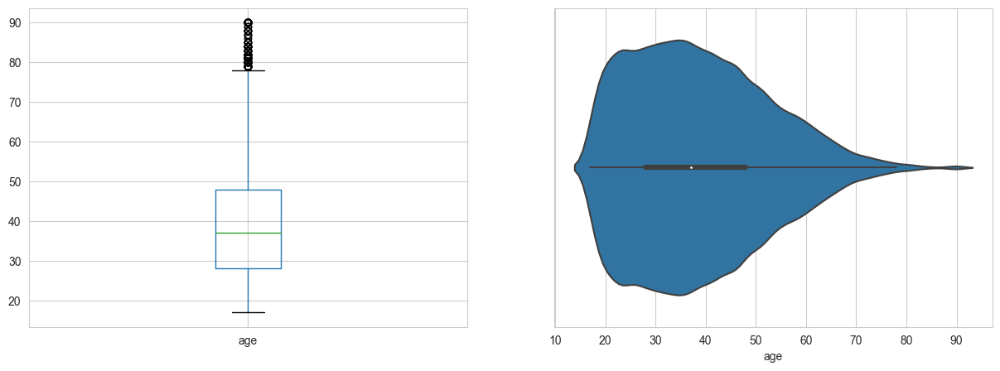

In [6]:
fig, axes = plt.subplots(1,2, figsize=(15,5))
df[['age']].boxplot(ax=axes[0])
sns.violinplot(data=df, x='age', ax=axes[1])


### Plot a barplot with the occupation of the population.

<Axes: xlabel='occupation'>

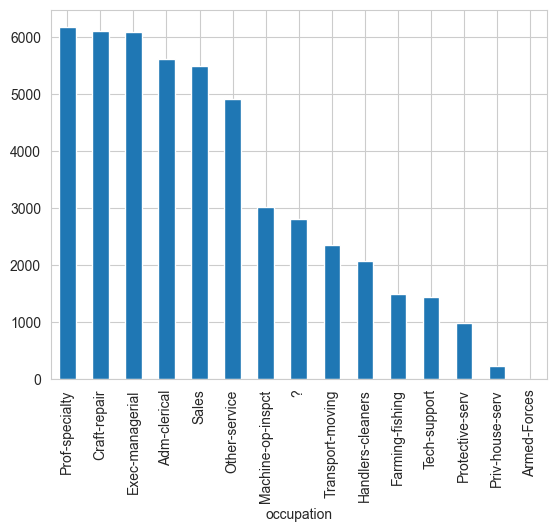

In [7]:
df['occupation'].value_counts().plot(kind='bar')

### Plot a barplot with the occupation of the population, but this time, the bars give the average age of the people in that occupation. (hint: use groupby to group the data by occupation and then use the mean function to get the average age)

<Axes: title={'center': 'Average age by occupation'}, xlabel='Occupation', ylabel='Average age'>

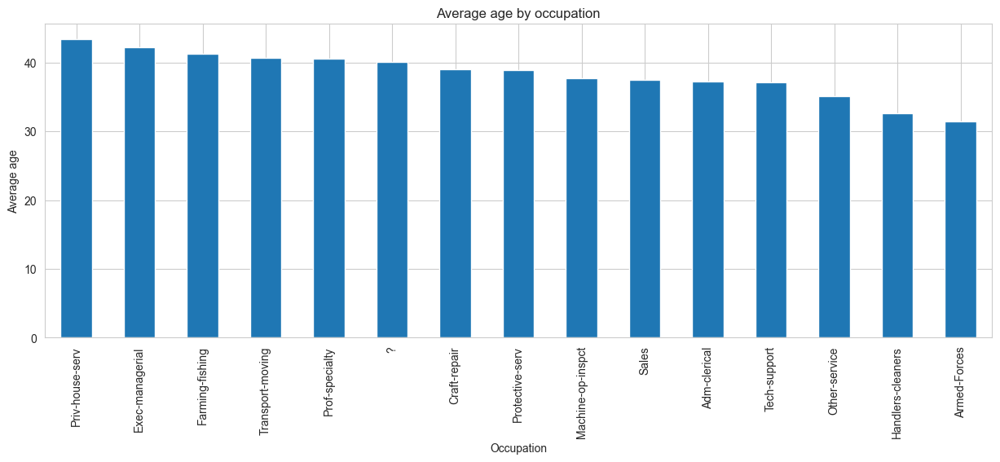

In [8]:
df.groupby('occupation')['age'].mean().sort_values(ascending=False).plot(kind='bar',
                                                                         figsize=(15,5),
                                                                         title='Average age by occupation',
                                                                         ylabel='Average age',
                                                                         xlabel='Occupation')

### Plot a KDE plot of the age of the population.

<Axes: xlabel='age', ylabel='Density'>

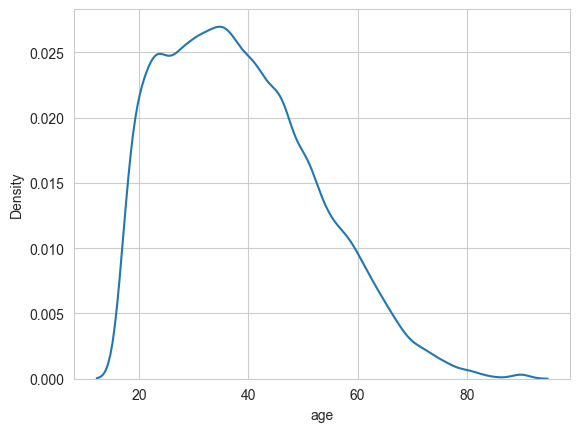

In [9]:
sns.kdeplot(data=df, x='age')

### Plot a scatterplot of the age and the hours-per-week of the population.

In [10]:
df.plot_bokeh.scatter(x='age', y='hours-per-week',
                      figsize=(600,600),
                      title='Age vs hours per week', xlabel='Age', ylabel='Hours per week',
                      colormap='viridis')

Figure(id='1003', ...)

### Plot the correlation matrix using a heatmap.

<Axes: >

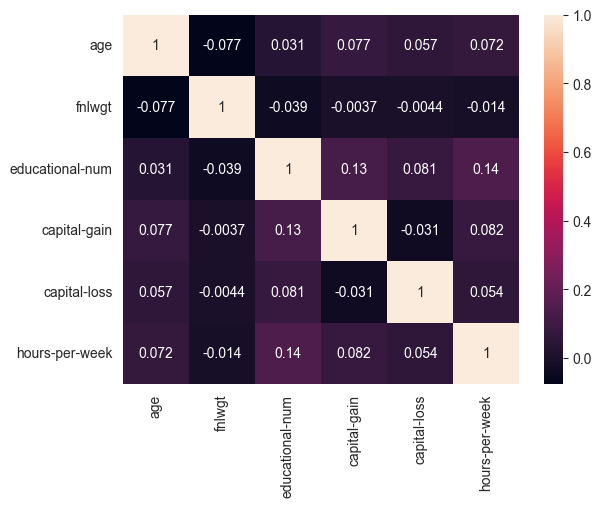

In [11]:
# get numeric columns
df_num = df.select_dtypes(include=np.number)

# compute correlation matrix
corr = df_num.corr()

# plot heatmap
sns.heatmap(corr, annot=True)

### Make a pairplot of the numerical columns of the dataset with kde plots in the diagonal and the hue set to the income column.

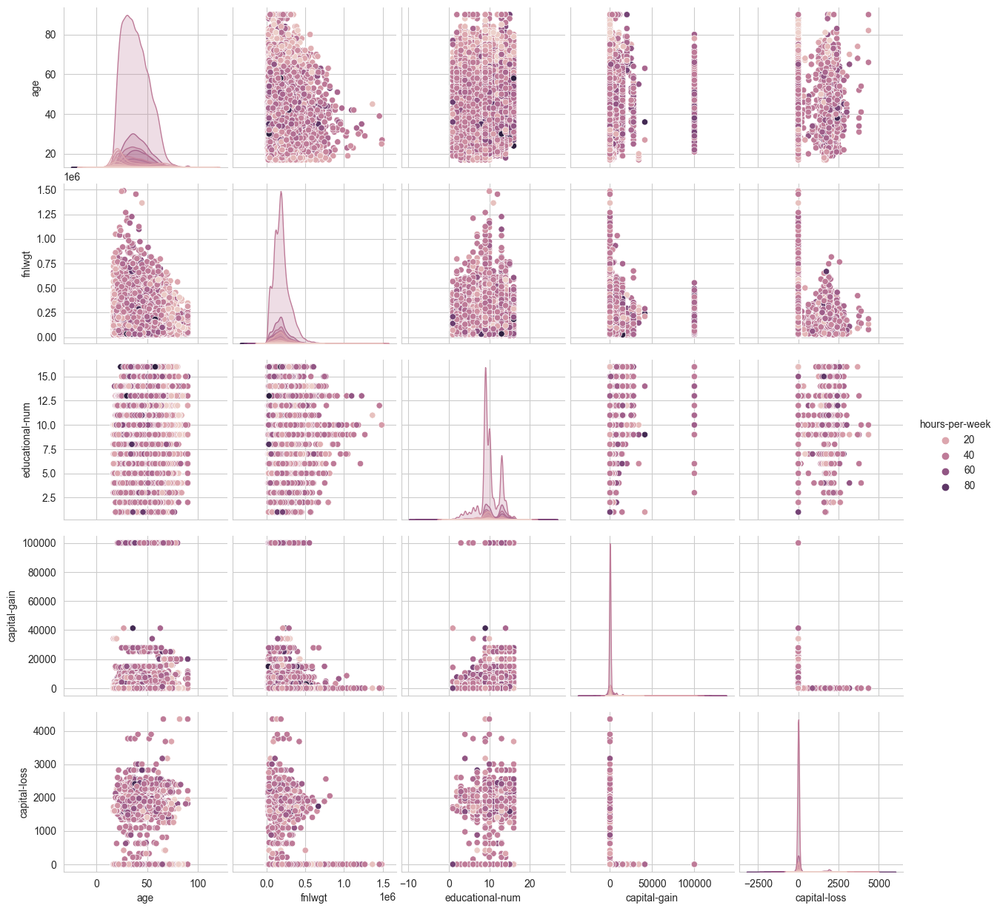

In [12]:
sns.pairplot(df_num, diag_kind='kde', hue='hours-per-week')

### Make a jointplot with a scatter plot of the age and the hours-per-week of the population and kde plots of the marginal distributions. (hint: use the jointplot function, set the kind to scatter and the hue to the workclass column)

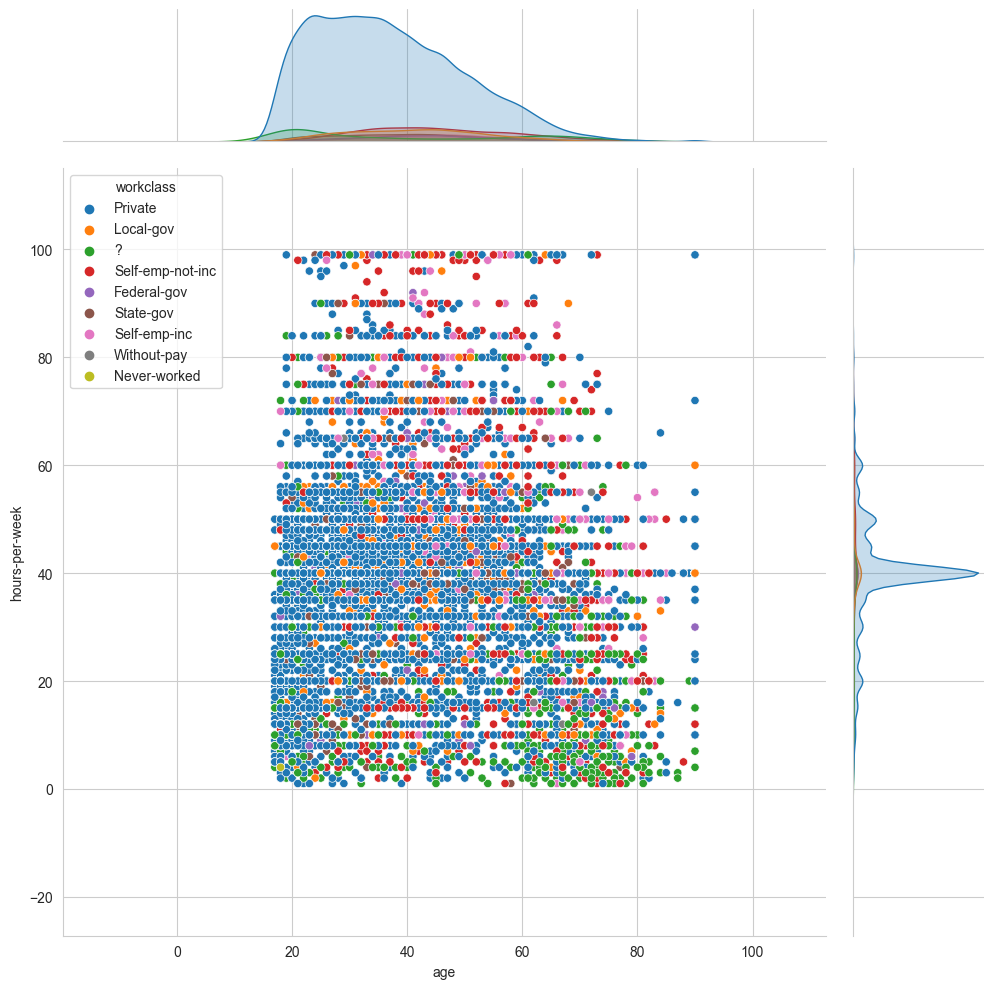

In [13]:
sns.jointplot(data=df,
              x='age', y='hours-per-week',
              kind='scatter',
              hue='workclass',
              height=10
)

## Fill missing values
### How many missing values are there in the dataset?

In [14]:
df.isna().sum()

age                0
workclass          0
fnlwgt             0
education          0
educational-num    0
marital-status     0
occupation         0
relationship       0
race               0
gender             0
capital-gain       0
capital-loss       0
hours-per-week     0
native-country     0
income             0
dtype: int64

You got none, right!

### Randomly drop some values from the dataframe
Let us randomly drop some values from the dataframe to simulate missing values. (hint: use np.random.choice to randomly select indices and columns to drop. then set the values of those indices to np.nan)

In [15]:
np.random.seed(42)

# random indices to be droped
for _ in range(1000):
    i, c = (np.random.choice(df.index), np.random.choice(df.columns))
    df.loc[i, c] = np.nan
df.isna().sum()

age                71
workclass          67
fnlwgt             66
education          63
educational-num    66
marital-status     59
occupation         73
relationship       72
race               65
gender             66
capital-gain       65
capital-loss       65
hours-per-week     71
native-country     57
income             72
dtype: int64


### fill missing values with the mean of the column if the Shapiro-Wilk test fails to reject the null hypothesis that the data was drawn from a normal distribution, i.e., the p-value is greater than 0.05. Otherwise, fill the missing values with the median of the column.

In [16]:
import scipy.stats as stats

# numeric columns list
num_cols = df.select_dtypes(include=np.number).columns

for col in num_cols:
    # get p-value
    s, p = stats.shapiro(df[col].dropna().sample(5000))
    if p > 0.05:
        print(f'{col} is normally distributed')
        df[col].fillna(df[col].mean(), inplace=True)
    else:
        print(f'{col} is not normally distributed')
        df[col].fillna(df[col].median(), inplace=True)

df.isna().sum()

age is not normally distributed
fnlwgt is not normally distributed
educational-num is not normally distributed
capital-gain is not normally distributed
capital-loss is not normally distributed
hours-per-week is not normally distributed


age                 0
workclass          67
fnlwgt              0
education          63
educational-num     0
marital-status     59
occupation         73
relationship       72
race               65
gender             66
capital-gain        0
capital-loss        0
hours-per-week      0
native-country     57
income             72
dtype: int64

### fill the categorical columns with the most frequent value.

In [17]:
cat_cols = df.select_dtypes(exclude=np.number).columns

for col in cat_cols:
    mode_val = df[col].mode()[0]
    df[col].fillna(mode_val, inplace=True)

df.isna().sum()

age                0
workclass          0
fnlwgt             0
education          0
educational-num    0
marital-status     0
occupation         0
relationship       0
race               0
gender             0
capital-gain       0
capital-loss       0
hours-per-week     0
native-country     0
income             0
dtype: int64

## Anomaly detection

Start by reloading the dataset, as we have modified it in the previous exercise.

In [18]:
df = pd.read_csv('./data/adult/adult.csv')

### Use the Interquartile Range (IQR) method to detect how many outliers there are in the age column. What percentage of the population is considered an outlier with this method? List the outliers.
(hint: use the quantile function to get the 25th and 75th percentiles and then compute the IQR. Then, use the IQR to compute the lower and upper bounds. Finally, use the lower and upper bounds to detect the outliers)

In [19]:
# get 25th and 75th percentiles
q1, q3 = df['age'].quantile([0.25, 0.75])

# compute IQR
iqr = q3 - q1

# compute lower and upper bounds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# detect outliers
outliers_IQR = df[(df['age'] < lower_bound) | (df['age'] > upper_bound)]

print(f'Number of outliers: {len(outliers_IQR)}')
print(f'Percentage of outliers: {len(outliers_IQR) / len(df) * 100:.2f}%')

outliers_IQR

Number of outliers: 216
Percentage of outliers: 0.44%


,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
193,79,?,48574,7th-8th,4,Widowed,?,Not-in-family,White,Male,0,0,40,United-States,<=50K
234,80,Self-emp-not-inc,201092,HS-grad,9,Married-civ-spouse,Other-service,Husband,White,Male,0,0,30,United-States,<=50K
899,90,Private,149069,Assoc-acdm,12,Married-civ-spouse,Sales,Husband,White,Male,0,1825,50,United-States,>50K
926,79,?,27457,Masters,14,Never-married,?,Not-in-family,White,Female,0,0,23,United-States,<=50K
951,80,Private,138050,HS-grad,9,Married-spouse-absent,Machine-op-inspct,Not-in-family,White,Female,0,0,16,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48558,90,Private,313749,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,25,United-States,<=50K
48648,90,Local-gov,214594,7th-8th,4,Married-civ-spouse,Protective-serv,Husband,White,Male,2653,0,40,United-States,<=50K
48740,85,Private,98611,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,3,Poland,<=50K
48775,82,?,403910,HS-grad,9,Never-married,?,Not-in-family,White,Male,0,0,3,United-States,<=50K


### Use the Z-score method to detect how many outliers there are in the age column. What percentage of the population is considered an outlier with this method? List the outliers.

In [20]:
# compute z-score
z = (df['age'] - df['age'].mean()) / df['age'].std()

# detect outliers
outliers_z_score = df[(z < -3) | (z > 3)]

print(f'Number of outliers: {len(outliers_z_score)}')
print(f'Percentage of outliers: {len(outliers_z_score) / len(df) * 100:.2f}%')

outliers_z_score

Number of outliers: 186
Percentage of outliers: 0.38%


,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
234,80,Self-emp-not-inc,201092,HS-grad,9,Married-civ-spouse,Other-service,Husband,White,Male,0,0,30,United-States,<=50K
899,90,Private,149069,Assoc-acdm,12,Married-civ-spouse,Sales,Husband,White,Male,0,1825,50,United-States,>50K
951,80,Private,138050,HS-grad,9,Married-spouse-absent,Machine-op-inspct,Not-in-family,White,Female,0,0,16,United-States,<=50K
1079,81,Private,184615,7th-8th,4,Widowed,Machine-op-inspct,Unmarried,White,Female,1264,0,40,United-States,<=50K
1398,82,Self-emp-inc,220667,7th-8th,4,Widowed,Exec-managerial,Not-in-family,White,Female,0,0,40,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48558,90,Private,313749,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,25,United-States,<=50K
48648,90,Local-gov,214594,7th-8th,4,Married-civ-spouse,Protective-serv,Husband,White,Male,2653,0,40,United-States,<=50K
48740,85,Private,98611,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,3,Poland,<=50K
48775,82,?,403910,HS-grad,9,Never-married,?,Not-in-family,White,Male,0,0,3,United-States,<=50K


### Which values values are below the percentile 1 and above the percentile 99 of the age column? What percentage of the population is considered an outlier with this method? List the outliers.

In [21]:
# get 5th and 95th percentiles
q5, q95 = df['age'].quantile([0.01, 0.99])

# detect outliers
outliers_percentile = df[(df['age'] < q5) | (df['age'] > q95)]

print(f'Number of outliers: {len(outliers_percentile)}')
print(f'Percentage of outliers: {len(outliers_percentile) / len(df) * 100:.2f}%')

outliers_percentile

Number of outliers: 445
Percentage of outliers: 0.91%


,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
193,79,?,48574,7th-8th,4,Widowed,?,Not-in-family,White,Male,0,0,40,United-States,<=50K
229,77,?,172744,Some-college,10,Married-civ-spouse,?,Husband,White,Male,0,0,35,United-States,<=50K
234,80,Self-emp-not-inc,201092,HS-grad,9,Married-civ-spouse,Other-service,Husband,White,Male,0,0,30,United-States,<=50K
437,75,?,26586,10th,6,Married-spouse-absent,?,Not-in-family,White,Female,0,0,5,United-States,<=50K
899,90,Private,149069,Assoc-acdm,12,Married-civ-spouse,Sales,Husband,White,Male,0,1825,50,United-States,>50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48621,75,Self-emp-not-inc,192813,Masters,14,Widowed,Sales,Not-in-family,White,Male,0,0,45,United-States,<=50K
48648,90,Local-gov,214594,7th-8th,4,Married-civ-spouse,Protective-serv,Husband,White,Male,2653,0,40,United-States,<=50K
48740,85,Private,98611,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,3,Poland,<=50K
48775,82,?,403910,HS-grad,9,Never-married,?,Not-in-family,White,Male,0,0,3,United-States,<=50K


### Use the Isolation Forest algorithm to detect how many outliers there are in the population. Use a contamination of 0.01. List the outliers.

In [22]:
from sklearn.ensemble import IsolationForest

# get numeric columns
df_num = df.select_dtypes(include=np.number)

# fit Isolation Forest
clf = IsolationForest(random_state=42, contamination=0.01)
clf.fit(df_num)

# get outliers
outliers_IF = df[clf.predict(df_num) == -1]

print(f'Number of outliers: {len(outliers_IF)}')
print(f'Percentage of outliers: {len(outliers_IF) / len(df) * 100:.2f}%')

outliers_IF

/Users/pcardoso/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Number of outliers: 489
Percentage of outliers: 1.00%


,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
83,44,Self-emp-inc,223881,HS-grad,9,Married-civ-spouse,Craft-repair,Husband,White,Male,99999,0,50,?,>50K
346,39,Private,198654,HS-grad,9,Divorced,Exec-managerial,Unmarried,Black,Female,99999,0,40,United-States,>50K
357,50,Self-emp-not-inc,165001,Prof-school,15,Married-civ-spouse,Prof-specialty,Husband,White,Male,99999,0,80,United-States,>50K
418,54,Self-emp-inc,159219,Prof-school,15,Married-civ-spouse,Prof-specialty,Husband,White,Male,99999,0,40,United-States,>50K
518,41,Private,177989,Doctorate,16,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,2051,60,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48316,40,Private,566537,Preschool,1,Married-civ-spouse,Other-service,Husband,White,Male,0,1672,40,Mexico,<=50K
48371,66,Private,115498,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,99999,0,55,?,>50K
48519,47,Private,294913,Prof-school,15,Married-civ-spouse,Exec-managerial,Husband,White,Male,99999,0,40,United-States,>50K
48622,74,Self-emp-not-inc,199136,Bachelors,13,Widowed,Craft-repair,Not-in-family,White,Male,15831,0,8,Germany,>50K


### Use an autoencoder to detect how many outliers there are in the population. List the outliers.

In [23]:
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# get numeric columns
df_num = df.select_dtypes(include=np.number)

# scale data
scaler = StandardScaler()
df_num_scaled = scaler.fit_transform(df_num)

# build autoencoder
model = Sequential()
model.add(Dense(16, activation='relu', input_shape=(df_num_scaled.shape[1],)))
model.add(Dense(8, activation='relu'))
model.add(Dense(3, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(df_num_scaled.shape[1], activation='linear'))

model.compile(optimizer='adam', loss='mse')

# train autoencoder
history = model.fit(df_num_scaled, df_num_scaled,
          epochs=20,
          batch_size=32,
          shuffle=True,
          validation_split=0.2,
          verbose=True)

# get reconstruction error
df_num_scaled_pred = model.predict(df_num_scaled)
mse = np.mean(np.power(df_num_scaled - df_num_scaled_pred, 2), axis=1)

# get outliers
outliers_AE = df[mse > np.quantile(mse, 0.99)]

print(f'Number of outliers: {len(outliers_AE)}')
print(f'Percentage of outliers: {len(outliers_AE) / len(df) * 100:.2f}%')

outliers_AE

2023-04-17 18:10:27.618972: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Epoch 1/20
1222/1222 [==============================] - 2s 970us/step - loss: 0.5534 - val_loss: 0.3032
Epoch 2/20
1222/1222 [==============================] - 1s 848us/step - loss: 0.2034 - val_loss: 0.1651
Epoch 3/20
1222/1222 [==============================] - 1s 886us/step - loss: 0.1370 - val_loss: 0.1218
Epoch 4/20
1222/1222 [==============================] - 1s 857us/step - loss: 0.1153 - val_loss: 0.1103
Epoch 5/20
1222/1222 [==============================] - 1s 834us/step - loss: 0.1072 - val_loss: 0.1036
Epoch 6/20
1222/1222 [==============================] - 1s 838us/step - loss: 0.1018 - val_loss: 0.0992
Epoch 7/20
1222/1222 [==============================] - 1s 835us/step - loss: 0.0979 - val_loss: 0.0946
Epoch 8/20
1222/1222 [==============================] - 1s 834us/step - loss: 0.0940 - val_loss: 0.0930
Epoch 9/20
1222/1222 [==============================] - 1s 884us/step - loss: 0.0906 - val_loss: 0.0888
Epoch 10/20
1222/1222 [==============================] - 1s 817u

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
53,22,Private,54164,HS-grad,9,Never-married,Other-service,Not-in-family,White,Male,14084,0,60,United-States,>50K
70,55,Private,323887,Some-college,10,Married-civ-spouse,Exec-managerial,Husband,White,Male,15024,0,45,United-States,>50K
83,44,Self-emp-inc,223881,HS-grad,9,Married-civ-spouse,Craft-repair,Husband,White,Male,99999,0,50,?,>50K
90,59,Private,292946,Bachelors,13,Never-married,Exec-managerial,Not-in-family,White,Female,0,0,25,United-States,<=50K
181,56,Self-emp-inc,321529,Some-college,10,Married-civ-spouse,Exec-managerial,Husband,White,Male,15024,0,40,United-States,>50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48479,67,Self-emp-inc,182581,Some-college,10,Married-civ-spouse,Exec-managerial,Husband,White,Male,20051,0,20,United-States,>50K
48582,65,Local-gov,103153,7th-8th,4,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,1411,40,United-States,<=50K
48781,34,Private,60567,11th,7,Divorced,Transport-moving,Unmarried,White,Male,0,880,60,United-States,<=50K
48799,57,Local-gov,110417,HS-grad,9,Married-civ-spouse,Craft-repair,Husband,White,Male,99999,0,40,United-States,>50K


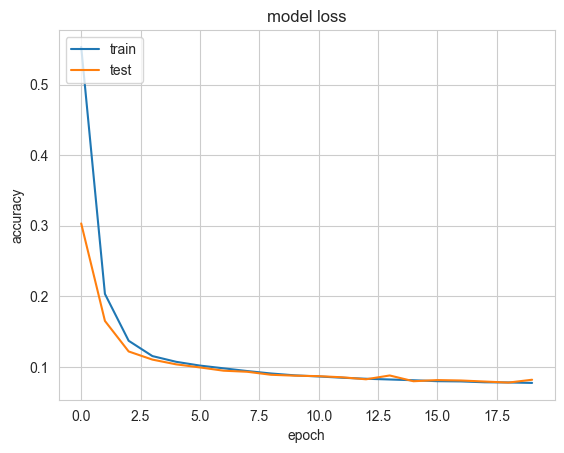

In [24]:
# plot loss during training
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

### Make a scatter plot of the age and hours-per-week columns. Color the points according to the outliers detected with the previous methods. What can you say about the outliers detected with the different methods?

In [28]:
## add column with outlier label
df['outlier_IQR'] = 3
df.loc[outliers_IQR.index, 'outlier_IQR'] = 1

df['outlier_z_score'] = 0
df.loc[outliers_z_score.index, 'outlier_z_score'] = 1

df['outlier_percentile'] = 0
df.loc[outliers_percentile.index, 'outlier_percentile'] = 1

df['outlier_IF'] = 0
df.loc[outliers_IF.index, 'outlier_IF'] = 1

df['outlier_AE'] = 0
df.loc[outliers_AE.index, 'outlier_AE'] = 1

outliers_cols = ['outlier_IQR', 'outlier_z_score', 'outlier_percentile', 'outlier_IF', 'outlier_AE']

df.head()

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,...,capital-loss,hours-per-week,native-country,income,outlier_IQR,outlier,outlier_z_score,outlier_percentile,outlier_IF,outlier_AE
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,...,0,40,United-States,<=50K,3,NaN,0,0,0,0
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,...,0,50,United-States,<=50K,3,NaN,0,0,0,0
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,...,0,40,United-States,>50K,3,NaN,0,0,0,0
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,...,0,40,United-States,>50K,3,NaN,0,0,0,0
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,...,0,30,United-States,<=50K,3,NaN,0,0,0,0


outlier_IQR 0
outlier_z_score 1
outlier_percentile 2
outlier_IF 3
outlier_AE 4


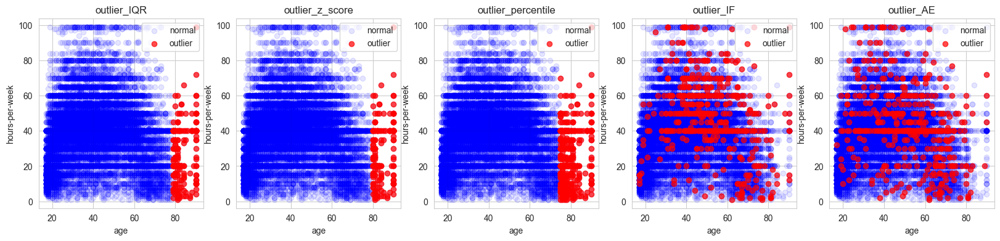

In [30]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, len(outliers_cols), figsize=(20, 4))

for i, col in enumerate(outliers_cols):
    print(col, i)
    # color normal points
    ax[i].scatter(df['age'], df['hours-per-week'], c='b', alpha=0.1, label='normal')
    # color outliers
    ax[i].scatter(df.loc[df[col] == 1, 'age'], df.loc[df[col] == 1, 'hours-per-week'], c='r', alpha=0.7, label='outlier')
    ax[i].set_xlabel('age')
    ax[i].set_ylabel('hours-per-week')
    ax[i].set_title(col)
    ax[i].legend()

plt.show()

### make a pairplot of the numerical columns. Color the points according to the outliers detected with the previous methods. What can you say about the outliers detected with the different methods?

In [38]:
import seaborn as sns

def plot_pairplot_with_outlier_marking(df, outlier_col):
    # get numeric columns
    df_num = df.select_dtypes(include=np.number)

    # outlier columns
    outliers_cols = ['outlier_IQR', 'outlier_z_score', 'outlier_percentile', 'outlier_IF', 'outlier_AE']

    # all but outlier columns
    df_num_without_ouliers = df_num.drop(outliers_cols, axis=1)
    df_num_without_ouliers[outlier_col] = df_num[outlier_col]

    sns.pairplot(df_num_without_ouliers, hue=outlier_col)
    plt.show()

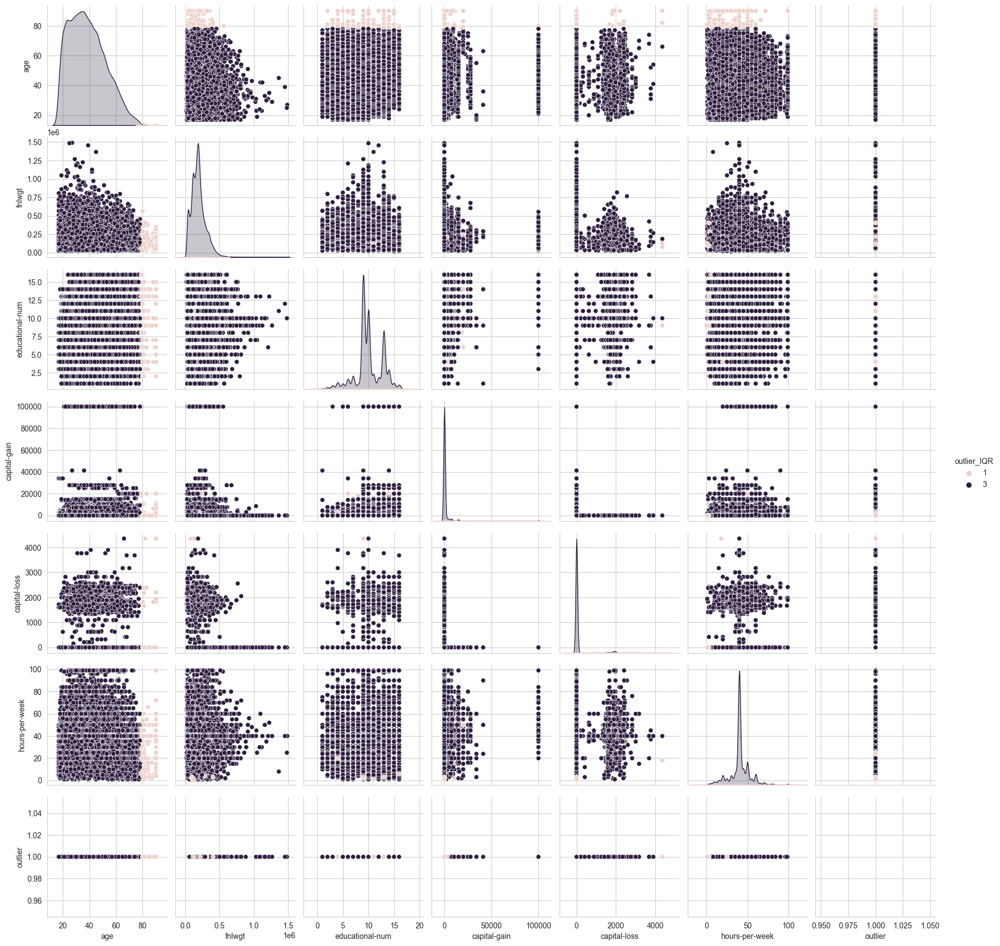

In [39]:
plot_pairplot_with_outlier_marking(df, 'outlier_IQR')

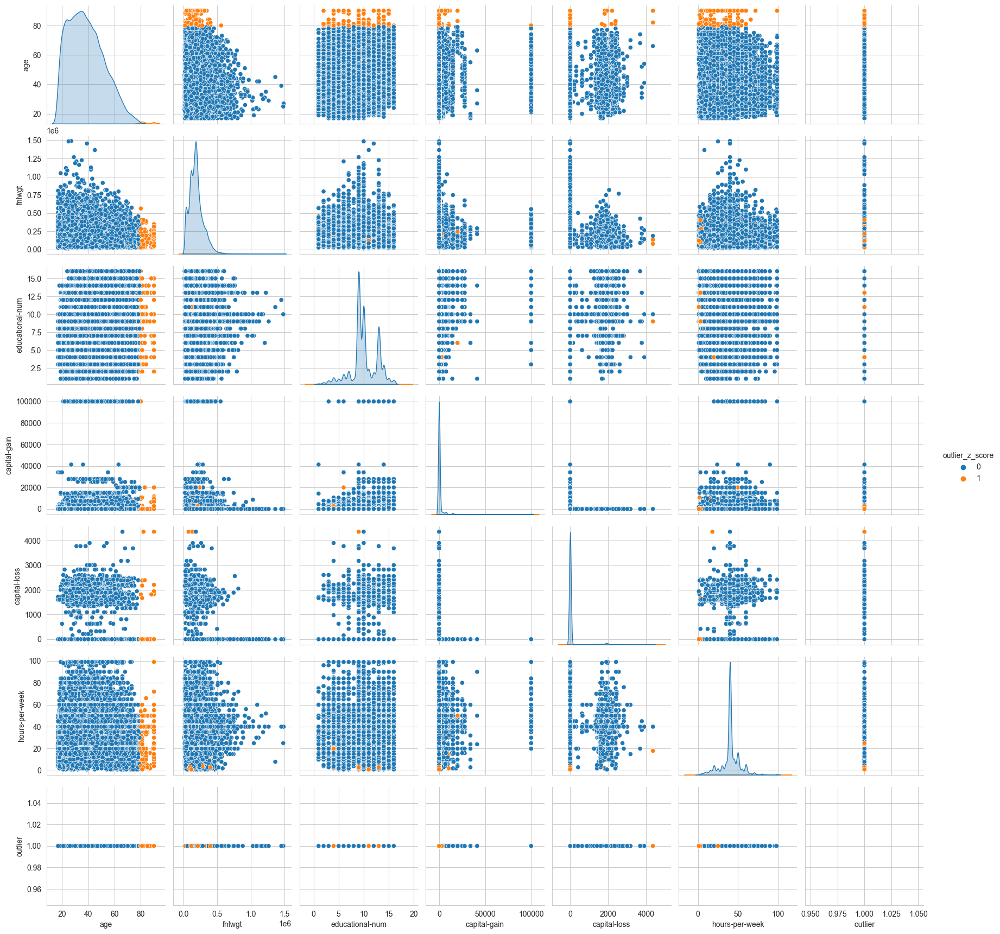

In [40]:
plot_pairplot_with_outlier_marking(df, 'outlier_z_score')

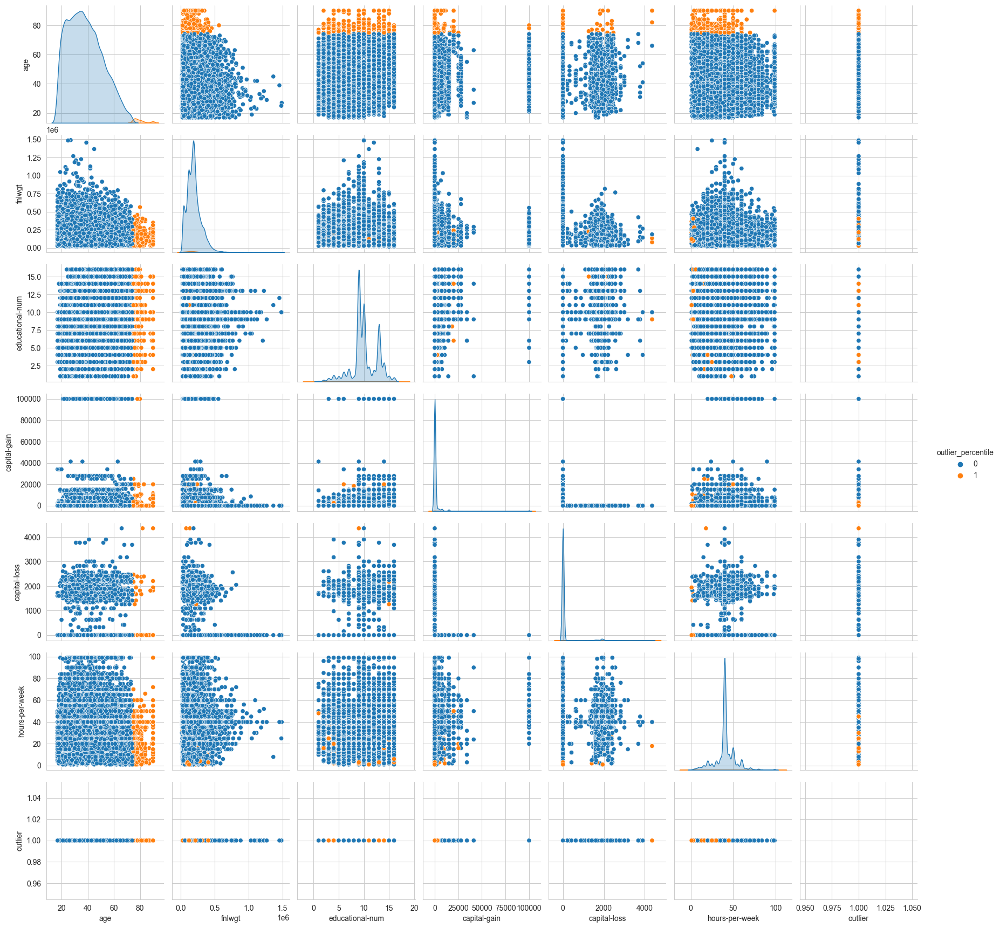

In [41]:
plot_pairplot_with_outlier_marking(df, 'outlier_percentile')

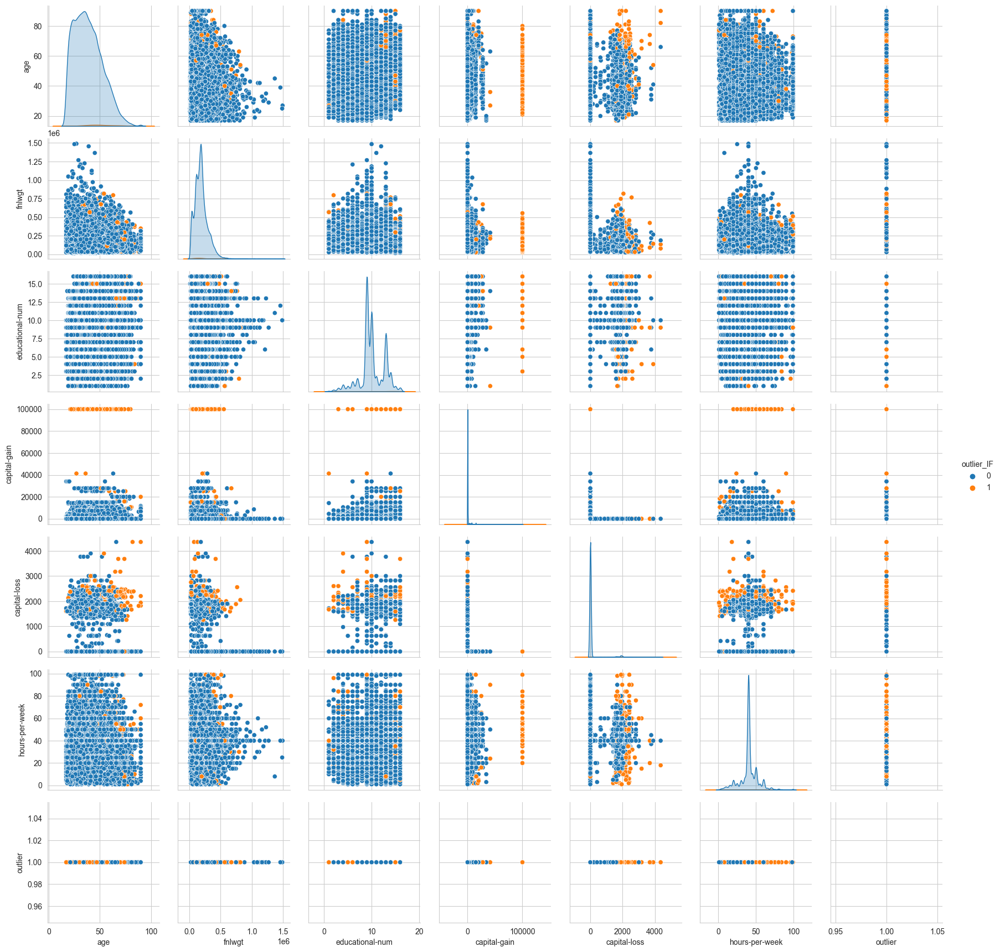

In [42]:
plot_pairplot_with_outlier_marking(df, 'outlier_IF')

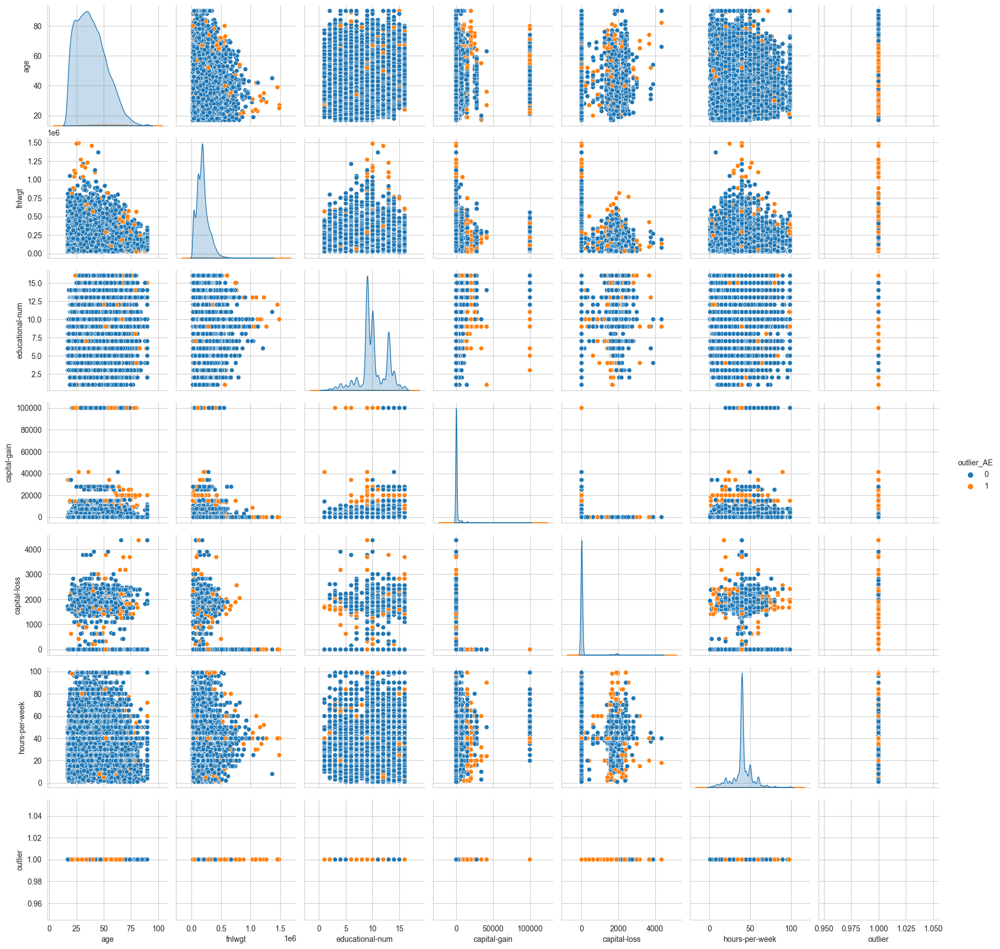

In [43]:
plot_pairplot_with_outlier_marking(df, 'outlier_AE')